In [295]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import pickle
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Lasso
from IPython.html import widgets
from IPython.html.widgets import interact
from IPython.display import display
import warnings
import requests
from sklearn.linear_model import Ridge
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import random
warnings.filterwarnings('ignore')


<h1>Loading Neccesary Config Files

In [5]:
%run config_odi_file.py

<h1>Functions for Utility

In [11]:
def decode_ODI(df_ODI):
    col_decode = df_ODI.columns
    for col in col_decode:
        try:
            col_dict = config_ODI[col]
        except:
            continue
        for col_val in col_dict:
            df_ODI[col] = df_ODI[col].replace(col_val, col_dict[col_val])
    return df_ODI

<h1>Loading Dataframe with all data

In [31]:
df_original = pd.read_csv(r"ODI_ver4.csv")

In [32]:
all_cols = df_original.columns

In [35]:
#for i in all_cols:
#    print(i)

In [65]:
df_original.columns

Index(['match_id', 'date', 'city', 'neutralvenue', 'toss_winner',
       'toss_decision', 'team_1', 'team_2', 'batsman', 'non_striker', 'bowler',
       'inning_no', 'over', 'run', 'extras_run', 'total_run', 'player_out',
       'method', 'winner_runs', 'winner_wickets', 'win_runs', 'win_wickets',
       'winner', 'wickets', 'curr_score', 'remaining_ball', 'final_score'],
      dtype='object')

In [37]:
df_original = df_original[['match_id', 'date', 'city', 'neutralvenue', 'toss_winner',
       'toss_decision', 'team_1', 'team_2', 'batsman', 'non_striker', 'bowler',
       'inning_no', 'over', 'run', 'extras_run', 'total_run', 'player_out',
       'method', 'winner_runs', 'winner_wickets', 'win_runs', 'win_wickets',
       'winner','wickets','curr_score','remaining_ball', 'final_score']]

In [59]:
atrributes_fetched = ['match_id', 'date', 'city', 'neutralvenue', 'toss_winner',
       'toss_decision', 'team_1', 'team_2', 'batsman', 'non_striker', 'bowler',
       'inning_no', 'over', 'run', 'extras_run','player_out',
       'method', 'winner_runs', 'winner_wickets', 'winner','final_score']
atrributes_derived = ['remaining_ball','total_run', 'win_runs', 'curr_score', 'wickets', 'win_wickets','final_score']
# final score is also a derived column which is th target variable

In [38]:
df_original= decode_ODI(df_original)

In [66]:
df_original.head(2)

,match_id,date,city,neutralvenue,toss_winner,toss_decision,team_1,team_2,batsman,non_striker,...,method,winner_runs,winner_wickets,win_runs,win_wickets,winner,wickets,curr_score,remaining_ball,final_score
0,1000887,13-01-2017,14,0,1,0,1,7,165,784,...,1,92,0,1,0,1,0,0,309,268
1,1000887,13-01-2017,14,0,1,0,1,7,165,784,...,1,92,0,1,0,1,0,0,308,268


<h1>Feature Engineering

In [71]:
def plot_corr(df,fname):
        corr=df.corr()
        plt.subplots(figsize=(20,15))
        sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns,cmap="YlGnBu",annot=True)
        plt.savefig(fname)

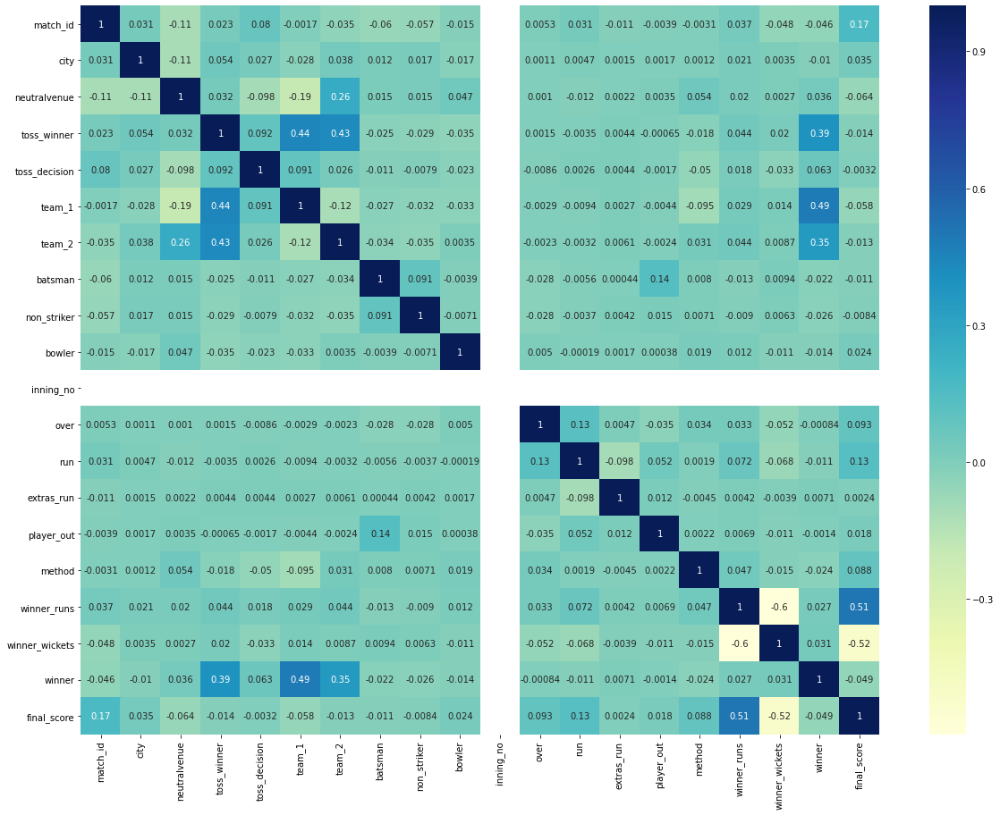

In [72]:
plot_corr(df_original[atrributes_fetched],'fig1')

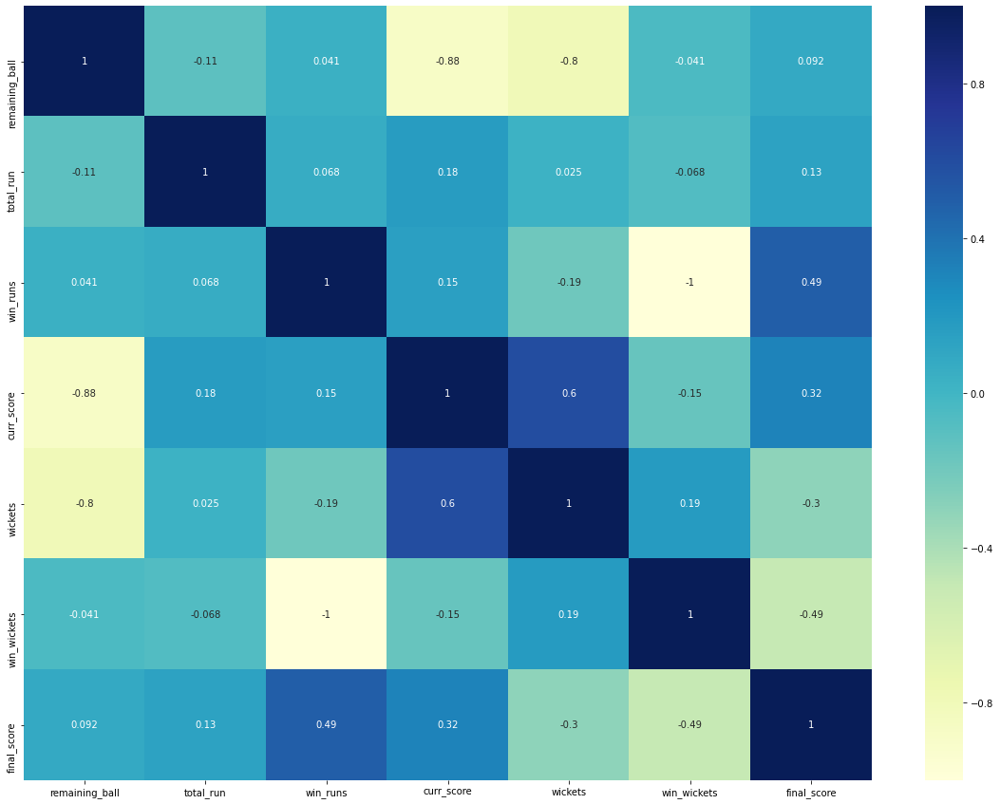

In [73]:
plot_corr(df_original[atrributes_derived],'fig2')

In [40]:
used_cols = ['city', 'neutralvenue', 'toss_winner', 'toss_decision',
 'team_1', 'team_2', 'batsman', 'non_striker', 'bowler', 
 'extras_run','player_out', 'wickets', 'curr_score', 
 'remaining_ball','final_score']

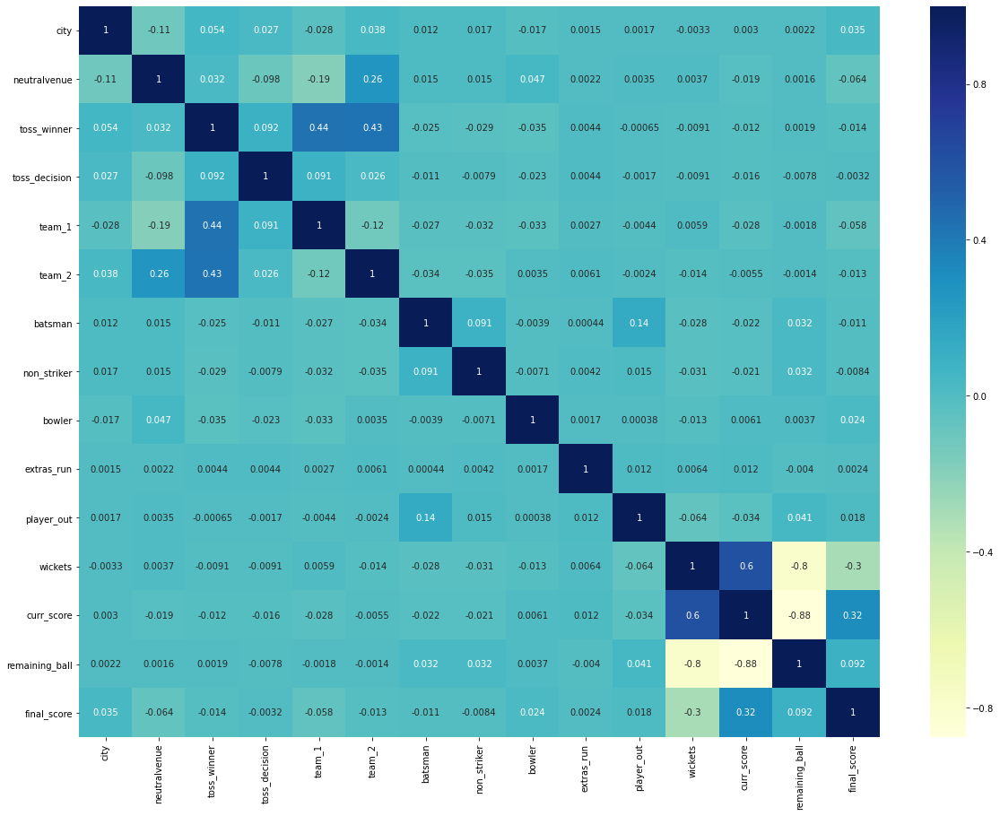

In [74]:
plot_corr(df_original[used_cols],'fig3')

In [70]:
#deleted columns
set(df_original.columns) - set(['match_id','city', 'neutralvenue', 'toss_winner', 'toss_decision',
       'team_1', 'team_2', 'batsman', 'non_striker', 'bowler', 'extras_run',
       'player_out', 'wickets', 'curr_score', 'remaining_ball','final_score'])

{'date',
 'inning_no',
 'method',
 'over',
 'run',
 'total_run',
 'win_runs',
 'win_wickets',
 'winner',
 'winner_runs',
 'winner_wickets'}

<h1>Preparing Data for Training Testing

In [64]:
% run case_wise_odi_ids.py #for loading test ids train ids

In [82]:
testing = df_original[['match_id','city', 'neutralvenue', 'toss_winner', 'toss_decision',
       'team_1', 'team_2', 'batsman', 'non_striker', 'bowler', 'extras_run',
       'player_out', 'wickets', 'curr_score', 'remaining_ball','final_score']]

In [83]:
testing.shape

(372150, 16)

<h5>Defining Functions for splitting Data

In [84]:
def fetch_data_test_train(test_id,train_id,df_new):
    df_train = pd.DataFrame()
    df_test = pd.DataFrame()
    i=0
    for t_id in test_id:
        i+=1
        df_test= df_test.append(df_new[df_new['match_id']==t_id])
    for m_id in train_id:
        i+=1
        df_train= df_train.append(df_new[df_new['match_id']==m_id])
    return df_test,df_train

In [85]:
def split_test_train(df_test,df_train):
    X_train = df_train[['city', 'neutralvenue', 'toss_winner', 'toss_decision',
           'team_1', 'team_2', 'batsman', 'non_striker', 'bowler', 'extras_run',
           'player_out', 'wickets', 'curr_score', 'remaining_ball']]
    y_train = df_train["final_score"]
    X_test = df_test[['city', 'neutralvenue', 'toss_winner', 'toss_decision',
           'team_1', 'team_2', 'batsman', 'non_striker', 'bowler', 'extras_run',
           'player_out', 'wickets', 'curr_score', 'remaining_ball']]
    y_test = df_test["final_score"]
    return X_test,y_test,X_train,y_train

<h5>Fetching Data Case Wise (k-folds Method)

<img src="kfolds.png">

In [86]:
print('Started')
test_1,train_1 = fetch_data_test_train(train_id=odi_cases_test_train['set_1']['train_id'],
                                       test_id=odi_cases_test_train['set_1']['test_id'],
                                       df_new=testing)
print("Case 1 Done fetching")
test_2,train_2 = fetch_data_test_train(train_id=odi_cases_test_train['set_2']['train_id'],
                                       test_id=odi_cases_test_train['set_2']['test_id'],
                                       df_new=testing)
print("Case 2 Done fetching")
test_3,train_3 = fetch_data_test_train(train_id=odi_cases_test_train['set_3']['train_id'],
                                       test_id=odi_cases_test_train['set_3']['test_id'],
                                       df_new=testing)
print("Case 3 Done fetching")
test_4,train_4 = fetch_data_test_train(train_id=odi_cases_test_train['set_4']['train_id'],
                                       test_id=odi_cases_test_train['set_4']['test_id'],
                                       df_new=testing)
print("Case 4 Done fetching")
test_5,train_5 = fetch_data_test_train(train_id=odi_cases_test_train['set_5']['train_id'],
                                       test_id=odi_cases_test_train['set_5']['test_id'],
                                       df_new=testing)
print("Case 5 Done fetching")

Started
Case 1 Done fetching
Case 2 Done fetching
Case 3 Done fetching
Case 4 Done fetching
Case 5 Done fetching


In [87]:
print("Spliting Data For All Datasets")
X_test_1,y_test_1,X_train_1,y_train_1 = split_test_train(test_1,train_1)
X_test_2,y_test_2,X_train_2,y_train_2 = split_test_train(test_2,train_2)
X_test_3,y_test_3,X_train_3,y_train_3 = split_test_train(test_3,train_3)
X_test_4,y_test_4,X_train_4,y_train_4 = split_test_train(test_4,train_4)
X_test_5,y_test_5,X_train_5,y_train_5 = split_test_train(test_5,train_5)

Spliting Data For All Datasets


<h1>Testing Training on different models

<h6>Models Function Defination

In [90]:
#MLPRegressor Model
def train_model_MLPRegressor(h_no,iter_no,X_test,y_test,X_train,y_train):
    regressor=MLPRegressor(activation='relu',solver='adam',hidden_layer_sizes=(h_no),
                       learning_rate='adaptive',verbose=True,max_iter=iter_no,random_state=1)
    regressor.fit(X_train,y_train)
    print(regressor.score(X_test,y_test))
    return regressor.score(X_test,y_test)

In [100]:
#LinearRegression Model
def train_model_linear(X_test,y_test,X_train,y_train):
    regressor=LinearRegression()
    regressor.fit(X_train,y_train)  
    return regressor.score(X_test,y_test)

In [103]:
#Ridge model
def train_models_ridge(X_test,y_test,X_train,y_train):
    regressor = Ridge(normalize=True)
    regressor.fit(X_train,y_train)
    return regressor.score(X_test,y_test)

In [114]:
#KNeighborsRegressor Model
def train_models_knr(X_test,y_test,X_train,y_train):
    regressor=KNeighborsRegressor(n_neighbors=10)
    regressor.fit(X_train,y_train)
    return regressor.score(X_test,y_test)

In [160]:
def train_models_lasso(X_test,y_test,X_train,y_train):
    regressor = Lasso()
    regressor.fit(X_train,y_train)  
    return regressor.score(X_test,y_test)  

<h6>Function to save testing info

In [132]:
def train_test_model_LinearRegression():
    test_results = dict()
    f_acc = 0
    test_results['Fold I'] = train_model_linear(X_test_1,y_test_1,X_train_1,y_train_1)
    test_results['Fold II'] = train_model_linear(X_test_2,y_test_2,X_train_2,y_train_2)
    test_results['Fold III'] = train_model_linear(X_test_3,y_test_3,X_train_3,y_train_3)
    test_results['Fold IV'] = train_model_linear(X_test_4,y_test_4,X_train_4,y_train_4)
    test_results['Fold V'] = train_model_linear(X_test_5,y_test_5,X_train_5,y_train_5)
    f_acc = test_results['Fold I']+test_results['Fold II']+test_results['Fold III']+test_results['Fold IV']+test_results['Fold V']
    f_acc/=5
    test_results['Avg Accuracy'] = f_acc
    return test_results

In [134]:
def train_test_model_ridge():
    test_results = dict()
    f_acc = 0
    test_results['Fold I'] = train_models_ridge(X_test_1,y_test_1,X_train_1,y_train_1)
    test_results['Fold II'] = train_models_ridge(X_test_2,y_test_2,X_train_2,y_train_2)
    test_results['Fold III'] = train_models_ridge(X_test_3,y_test_3,X_train_3,y_train_3)
    test_results['Fold IV'] = train_models_ridge(X_test_4,y_test_4,X_train_4,y_train_4)
    test_results['Fold V'] = train_models_ridge(X_test_5,y_test_5,X_train_5,y_train_5)
    f_acc = test_results['Fold I']+test_results['Fold II']+test_results['Fold III']+test_results['Fold IV']+test_results['Fold V']
    f_acc/=5
    test_results['Avg Accuracy'] = f_acc
    return test_results

In [144]:
def train_test_model_knr():
    test_results = dict()
    f_acc = 0
    print("Training Fold I")
    test_results['Fold I'] = train_models_knr(X_test_1,y_test_1,X_train_1,y_train_1)
    print("Training Fold II")
    test_results['Fold II'] = train_models_knr(X_test_2,y_test_2,X_train_2,y_train_2)
    print("Training Fold III")
    test_results['Fold III'] = train_models_knr(X_test_3,y_test_3,X_train_3,y_train_3)
    print("Training Fold IV")
    test_results['Fold IV'] = train_models_knr(X_test_4,y_test_4,X_train_4,y_train_4)
    print("Training Fold V")
    test_results['Fold V'] = train_models_knr(X_test_5,y_test_5,X_train_5,y_train_5)
    f_acc = test_results['Fold I']+test_results['Fold II']+test_results['Fold III']+test_results['Fold IV']+test_results['Fold V']
    f_acc/=5
    test_results['Avg Accuracy'] = f_acc
    return test_results

In [162]:
def train_test_model_lasso():
    test_results = dict()
    f_acc = 0
    print("Training Fold I")
    test_results['Fold I'] = train_models_lasso(X_test_1,y_test_1,X_train_1,y_train_1)
    print("Training Fold II")
    test_results['Fold II'] = train_models_lasso(X_test_2,y_test_2,X_train_2,y_train_2)
    print("Training Fold III")
    test_results['Fold III'] = train_models_lasso(X_test_3,y_test_3,X_train_3,y_train_3)
    print("Training Fold IV")
    test_results['Fold IV'] = train_models_lasso(X_test_4,y_test_4,X_train_4,y_train_4)
    print("Training Fold V")
    test_results['Fold V'] = train_models_lasso(X_test_5,y_test_5,X_train_5,y_train_5)
    f_acc = test_results['Fold I']+test_results['Fold II']+test_results['Fold III']+test_results['Fold IV']+test_results['Fold V']
    f_acc/=5
    test_results['Avg Accuracy'] = f_acc
    return test_results

In [129]:
def train_test_model_MLPRegressor(hl,m_iter):
    test_results = dict()
    f_acc = 0
    test_results['Fold I'] = train_model_MLPRegressor(hl,m_iter,X_test_1,y_test_1,X_train_1,y_train_1)
    test_results['Fold II'] = train_model_MLPRegressor(hl,m_iter,X_test_2,y_test_2,X_train_2,y_train_2)
    test_results['Fold III'] = train_model_MLPRegressor(hl,m_iter,X_test_3,y_test_3,X_train_3,y_train_3)
    test_results['Fold IV'] = train_model_MLPRegressor(hl,m_iter,X_test_4,y_test_4,X_train_4,y_train_4)
    test_results['Fold V'] = train_model_MLPRegressor(hl,m_iter,X_test_5,y_test_5,X_train_5,y_train_5)
    f_acc = test_results['Fold I']+test_results['Fold II']+test_results['Fold III']+test_results['Fold IV']+test_results['Fold V']
    f_acc/=5
    test_results['Avg Accuracy'] = f_acc
    return test_results

<h6>Training and Testing using k-folds method

In [130]:
results = dict()

In [145]:
result_knr = train_test_model_knr()

Training Fold I
Training Fold II
Training Fold III
Training Fold IV
Training Fold V


In [147]:
result_ridge = train_test_model_ridge()

In [148]:
result_LinearRg = train_test_model_LinearRegression()

In [166]:
result_lasso = train_test_model_lasso()

Training Fold I
Training Fold II
Training Fold III
Training Fold IV
Training Fold V


In [182]:
result_MLPRg = train_test_model_MLPRegressor(390,3)

Iteration 1, loss = 702.20081982
Iteration 2, loss = 505.99614928
Iteration 3, loss = 497.89091892
0.7167881975617116
Iteration 1, loss = 711.08447898
Iteration 2, loss = 505.87218899
Iteration 3, loss = 499.90587568
0.7298457259204855
Iteration 1, loss = 689.00026267
Iteration 2, loss = 499.63668855
Iteration 3, loss = 492.42095107
0.7561202336131356
Iteration 1, loss = 696.34454937
Iteration 2, loss = 505.21368813
Iteration 3, loss = 493.21670105
0.7145075754405574
Iteration 1, loss = 661.10074800
Iteration 2, loss = 486.46306454
Iteration 3, loss = 478.63122255
0.7053085502030843


In [ ]:
"""
for 400
.730 for 2 itera
0.729 for 3 itera
.725 for 10 itera
.713 for 20 itera"""

In [168]:
results['LinearRegressionModel'] = result_LinearRg
results['MLPRegressionModel'] = result_MLPRg
results['KNRegressionModel'] = result_knr
results['LassoModel'] = result_lasso
results['RidgeModel'] = result_ridge

In [174]:
for i in results.keys():
    print("\n",i," ===>")
    for j in results[i]:
        print("\t",j,"\t:\t",results[i][j])


 LinearRegressionModel  ===>
	 Fold I 	:	 0.6829192276196494
	 Fold II 	:	 0.7135601913962297
	 Fold III 	:	 0.7114801380748649
	 Fold IV 	:	 0.6814658129467048
	 Fold V 	:	 0.687213805168842
	 Avg Accuracy 	:	 0.6953278350412582

 MLPRegressionModel  ===>
	 Fold I 	:	 0.710630792701159
	 Fold II 	:	 0.7400616993451268
	 Fold III 	:	 0.7537824307157096
	 Fold IV 	:	 0.7260174170434226
	 Fold V 	:	 0.7192599013251018
	 Avg Accuracy 	:	 0.729950448226104

 KNRegressionModel  ===>
	 Fold I 	:	 0.24976374459490458
	 Fold II 	:	 0.29896370275992146
	 Fold III 	:	 0.37728965868783315
	 Fold IV 	:	 0.29431439847982765
	 Fold V 	:	 0.33764419975500415
	 Avg Accuracy 	:	 0.31159514085549816

 LassoModel  ===>
	 Fold I 	:	 0.6815285021336319
	 Fold II 	:	 0.7103165018062285
	 Fold III 	:	 0.7111205812229207
	 Fold IV 	:	 0.6846297980293102
	 Fold V 	:	 0.6832654628501589
	 Avg Accuracy 	:	 0.6941721692084502

 RidgeModel  ===>
	 Fold I 	:	 0.2624879644596052
	 Fold II 	:	 0.2460805269795614
	 F

<h6>Models taken into consideration

In [214]:
MLP_model=MLPRegressor(activation='relu',solver='adam',hidden_layer_sizes=(400),
                       learning_rate='adaptive',verbose=True,max_iter=3,random_state=1)
MLP_model.fit(X_train_3,y_train_3)
print(MLP_model.score(X_test_3,y_test_3))

Iteration 1, loss = 713.88343843
Iteration 2, loss = 501.06791587
Iteration 3, loss = 491.26931133
0.7537824307157096


In [215]:
lasso_model = Lasso()
lasso_model.fit(X_train_3,y_train_3)
lasso_model.score(X_test_3,y_test_3)  

0.7111205812229207

In [216]:
Liner_R_model=LinearRegression()
Liner_R_model.fit(X_train_3,y_train_3)  
Liner_R_model.score(X_test_3,y_test_3)

0.7114801380748649

<h6>testing for over wise dataset : PART I

In [277]:
def split_overwise(X_test, y_test):
    df = X_test.copy();
    df['final_score'] = y_test;
    df1 = df[df['remaining_ball']>180]
    df2 = df[(df['remaining_ball']>120) & (df['remaining_ball']<=180)]
    df3 = df[(df['remaining_ball']>60) & (df['remaining_ball']<=120)]
    df4 = df[(df['remaining_ball']>=0) & (df['remaining_ball']<=60)]
   
    X_test1, y_test1 = df1.iloc[:,:-1],df1.iloc[:,-1]
    X_test2, y_test2 = df2.iloc[:,:-1],df2.iloc[:,-1]
    X_test3, y_test3 = df3.iloc[:,:-1],df3.iloc[:,-1]
    X_test4, y_test4 = df4.iloc[:,:-1],df4.iloc[:,-1]
    
    return X_test1,X_test2,X_test3,X_test4,y_test1,y_test2,y_test3,y_test4

In [278]:
x_0_20,x_20_30,x_30_40,x_40_50,y_0_20,y_20_30,y_30_40,y_40_50 = split_overwise(X_test_3,y_test_3)

In [279]:
results_overwise = dict()

In [280]:
mlp_results = dict()
mlp_results['Average'] = MLP_model.score(X_test_3,y_test_3)*100
mlp_results['Over 0   to  20'] = MLP_model.score(x_0_20,y_0_20)*100
mlp_results['Over 20  to  30'] = MLP_model.score(x_20_30,y_20_30)*100
mlp_results['Over 30  to  40'] = MLP_model.score(x_30_40,y_30_40)*100
mlp_results['Over 40  to  50'] = MLP_model.score(x_40_50,y_40_50)*100
print(mlp_results)

{'Average': 75.37824307157096, 'Over 0   to  20': 51.2991824012049, 'Over 20  to  30': 78.42737791996275, 'Over 30  to  40': 87.50267252701506, 'Over 40  to  50': 94.69488715184055}


In [281]:
lasso_results = dict()
lasso_results['Average'] = lasso_model.score(X_test_3,y_test_3)*100
lasso_results['Over 0   to  20'] = lasso_model.score(x_0_20,y_0_20)*100
lasso_results['Over 20  to  30'] = lasso_model.score(x_20_30,y_20_30)*100
lasso_results['Over 30  to  40'] = lasso_model.score(x_30_40,y_30_40)*100
lasso_results['Over 40  to  50'] = lasso_model.score(x_40_50,y_40_50)*100

print(lasso_results)

{'Average': 71.11205812229207, 'Over 0   to  20': 43.357013957128956, 'Over 20  to  30': 75.32218169692482, 'Over 30  to  40': 86.98423154277799, 'Over 40  to  50': 90.81771294490369}


In [282]:
Liner_R_results = dict()
Liner_R_results['Average'] = Liner_R_model.score(X_test_3,y_test_3)*100
Liner_R_results['Over 0   to  20'] = Liner_R_model.score(x_0_20,y_0_20)*100
Liner_R_results['Over 20  to  30'] = Liner_R_model.score(x_20_30,y_20_30)*100
Liner_R_results['Over 30  to  40'] = Liner_R_model.score(x_30_40,y_30_40)*100
Liner_R_results['Over 40  to  50'] = Liner_R_model.score(x_40_50,y_40_50)*100

print(Liner_R_results)

{'Average': 71.14801380748649, 'Over 0   to  20': 43.632251474755, 'Over 20  to  30': 75.64790635223603, 'Over 30  to  40': 87.02289927198787, 'Over 40  to  50': 90.22194978585735}


In [283]:
results_overwise['MLP_Model'] = mlp_results
results_overwise['Lasso_Model'] = lasso_results
results_overwise['Linear_R_Model'] = Liner_R_results

In [284]:
results_overwise.keys()
print("Over Class","\t\tMLP_Model","\t\tLasso_Model","\t\tLinear_R_Model\n")
print("Over 0   to  20\t      ",results_overwise['MLP_Model']["Over 0   to  20"],
      "\t",results_overwise['Lasso_Model']["Over 0   to  20"],"\t",results_overwise['Linear_R_Model']["Over 0   to  20"])
print("Over 20  to  30\t      ",results_overwise['MLP_Model']["Over 20  to  30"],
      "\t",results_overwise['Lasso_Model']["Over 20  to  30"],"\t",results_overwise['Linear_R_Model']["Over 20  to  30"])
print("Over 30  to  40\t      ",results_overwise['MLP_Model']["Over 30  to  40"],
      "\t",results_overwise['Lasso_Model']["Over 30  to  40"],"\t",results_overwise['Linear_R_Model']["Over 30  to  40"])
print("Over 40  to  50\t      ",results_overwise['MLP_Model']["Over 40  to  50"],
      "\t",results_overwise['Lasso_Model']["Over 40  to  50"],"\t",results_overwise['Linear_R_Model']["Over 40  to  50"])

print("\nAverage\t\t      ",results_overwise['MLP_Model']["Average"],
      "\t",results_overwise['Lasso_Model']["Average"],"\t",results_overwise['Linear_R_Model']["Average"])

Over Class 		MLP_Model 		Lasso_Model 		Linear_R_Model

Over 0   to  20	       51.2991824012049 	 43.357013957128956 	 43.632251474755
Over 20  to  30	       78.42737791996275 	 75.32218169692482 	 75.64790635223603
Over 30  to  40	       87.50267252701506 	 86.98423154277799 	 87.02289927198787
Over 40  to  50	       94.69488715184055 	 90.81771294490369 	 90.22194978585735

Average		       75.37824307157096 	 71.11205812229207 	 71.14801380748649


<h1>Plotting Graphs

In [640]:
config_ODI['team_1']

{'Afghanistan': 0,
 'Australia': 1,
 'Bangladesh': 2,
 'England': 3,
 'India': 4,
 'Ireland': 5,
 'New Zealand': 6,
 'Pakistan': 7,
 'South Africa': 8,
 'Sri Lanka': 9,
 'West Indies': 10,
 'Zimbabwe': 11}

In [474]:
def graph_real_and_predicted(X_graph, y_graph,ypred,fname=None):
    X = X_graph
    Y = y_graph
    X1 = X['team_1']
    X2 = X['team_2']
    fig = plt.figure(dpi=100, figsize=(20, 10))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(X1, X2, Y, c='#219E00', label='Actual Score', s = 45)
    ax.scatter(X1, X2, ypred, c='#080076', label='Predicted Score', s = 45)
    ax.set_xlabel('\n\n\nTeam Batting')
    ax.set_ylabel('\n\n\nTeam Bowling')
    ax.set_zlabel('\nFinal Score')
    plt.legend()
    if fname is not None:
        plt.savefig('images/' + fname + '.jpg')

In [475]:
def get_graph_data(X_test,y_test,model):
    df = X_test.copy();
    df['final_score'] = y_test;
    df = df[df['remaining_ball']==(int(df['remaining_ball'].median()))]
    X, y = df.iloc[:,:-1],df.iloc[:,-1]
    y_pred = model.predict(X)
    return X,y,y_pred

<h6>MLP Model

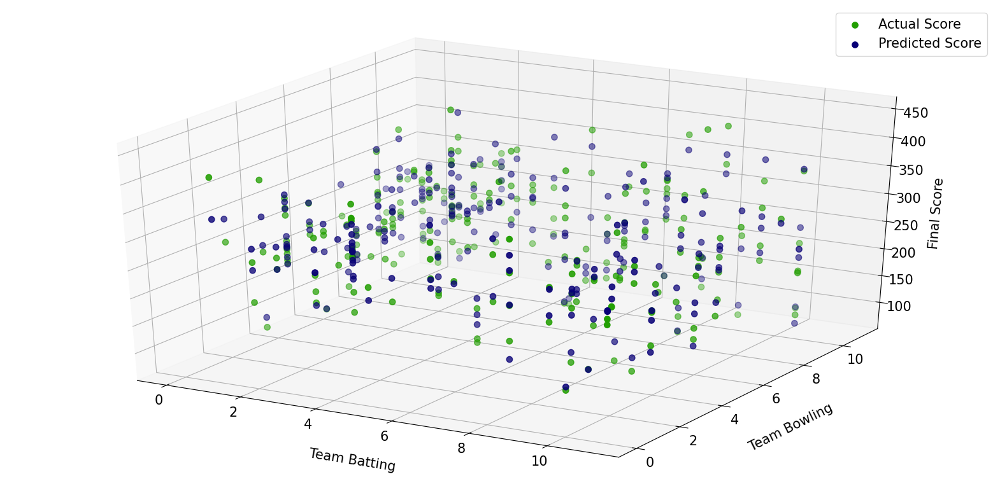

In [476]:
#All Data tested
X,Y,Y_p = get_graph_data(X_test_3,y_test_3,MLP_model)
graph_real_and_predicted(X,Y,Y_p,"MLP_all_test_data")

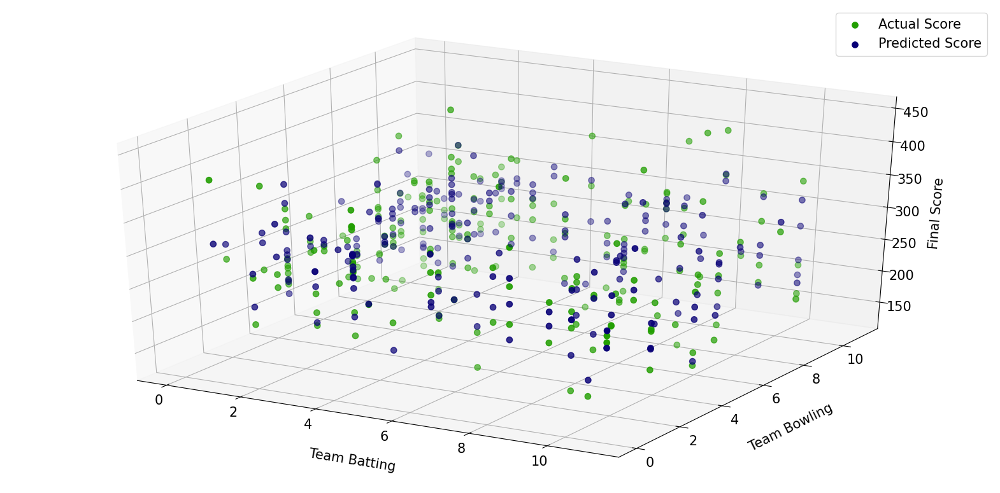

In [477]:
#over 0 to 20
X,Y,Y_p = get_graph_data(x_0_20,y_0_20,MLP_model)
graph_real_and_predicted(X,Y,Y_p,"MLP_over_0_to_20")

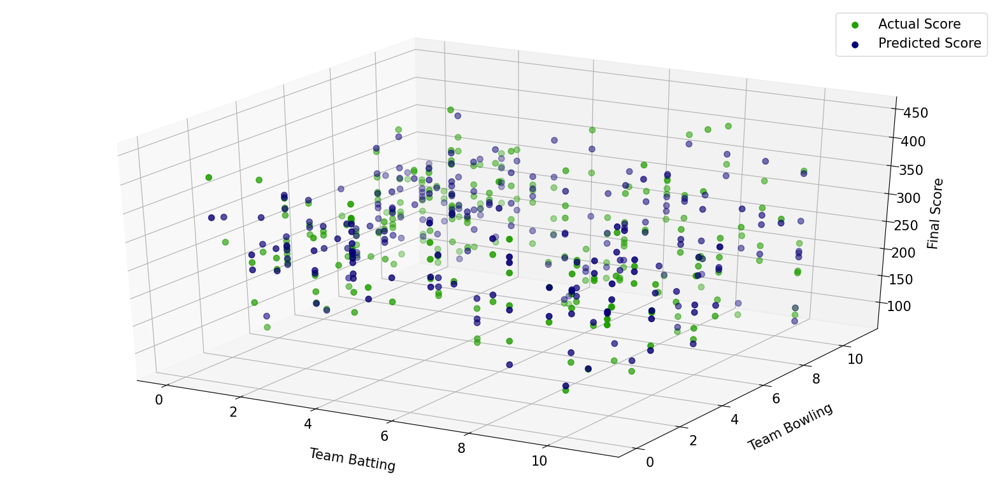

In [478]:
X,Y,Y_p = get_graph_data(x_20_30,y_20_30,MLP_model)
graph_real_and_predicted(X,Y,Y_p,"MLP_over_20_to_30")

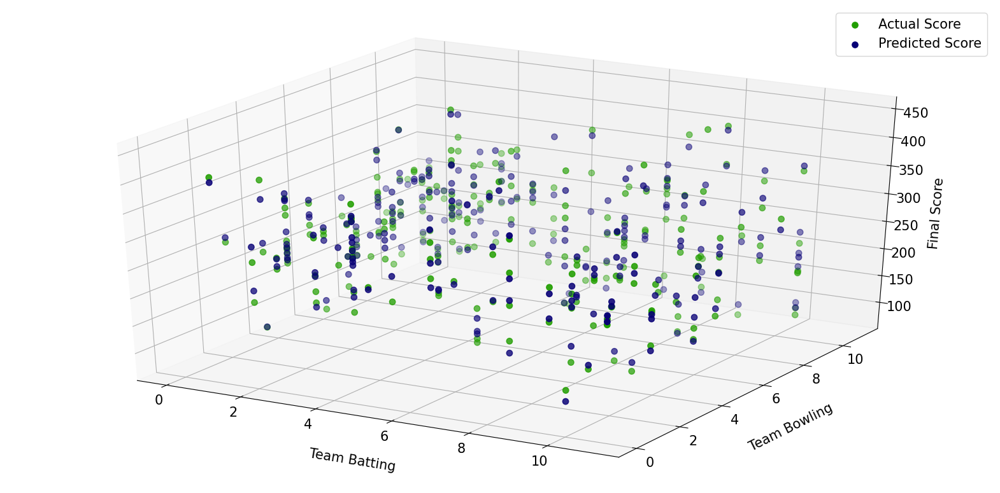

In [479]:
X,Y,Y_p = get_graph_data(x_30_40,y_30_40,MLP_model)
graph_real_and_predicted(X,Y,Y_p,"MLP_over_30_to_40")

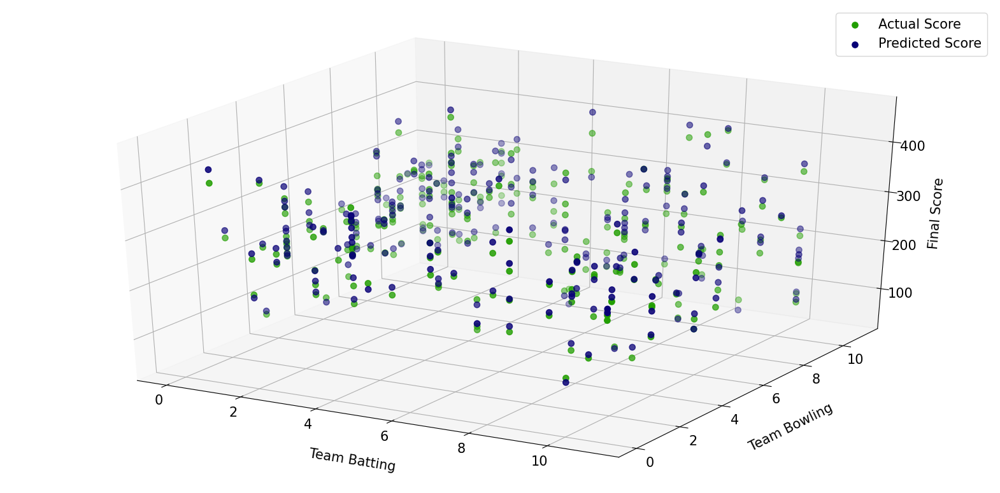

In [480]:
X,Y,Y_p = get_graph_data(x_40_50,y_40_50,MLP_model)
graph_real_and_predicted(X,Y,Y_p,"MLP_over_40_to_50")

<h6>Linear Model

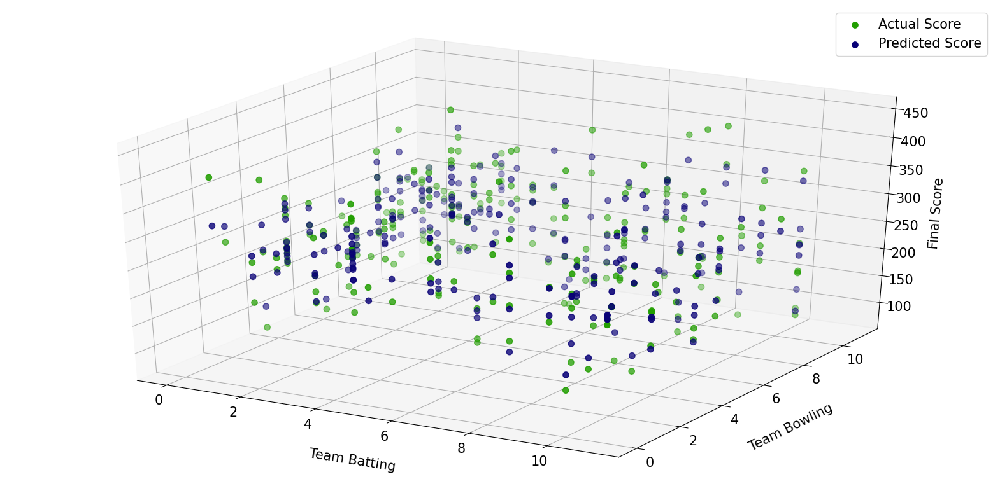

In [481]:
#All Data tested
X,Y,Y_p = get_graph_data(X_test_3,y_test_3,Liner_R_model)
graph_real_and_predicted(X,Y,Y_p,"Linear_all_test_data")

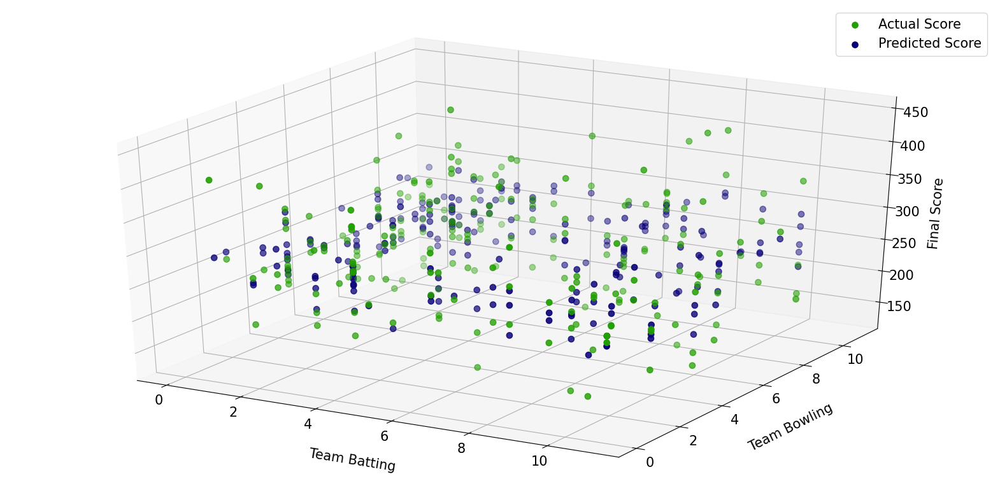

In [482]:
#over 0 to 20
X,Y,Y_p = get_graph_data(x_0_20,y_0_20,Liner_R_model)
graph_real_and_predicted(X,Y,Y_p,"Linear_over_0_to_20")

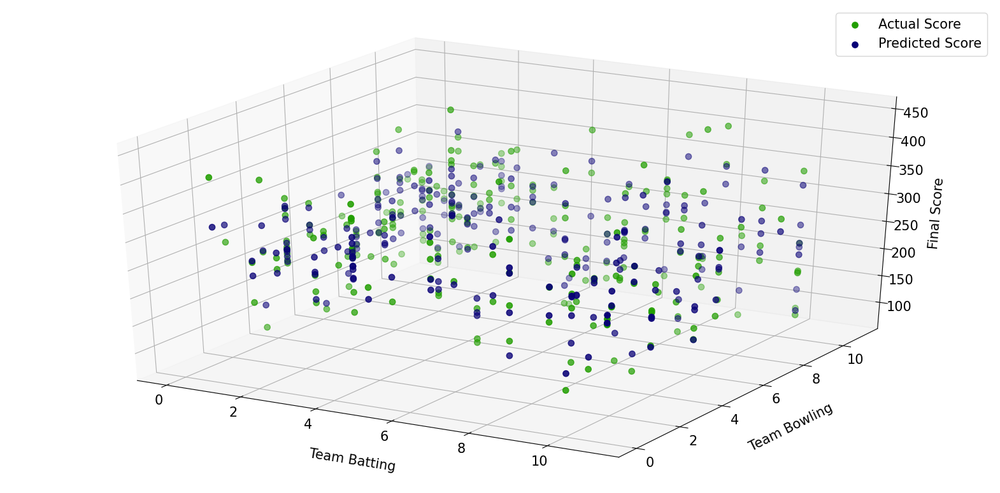

In [483]:
X,Y,Y_p = get_graph_data(x_20_30,y_20_30,Liner_R_model)
graph_real_and_predicted(X,Y,Y_p,"Linear_over_20_to_30")

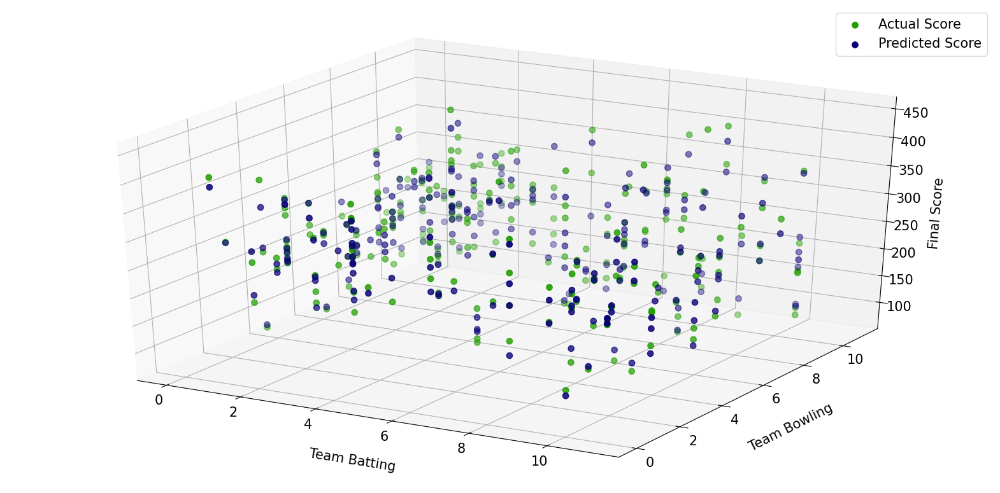

In [484]:
X,Y,Y_p = get_graph_data(x_30_40,y_30_40,Liner_R_model)
graph_real_and_predicted(X,Y,Y_p,"Linear_over_30_to_40")

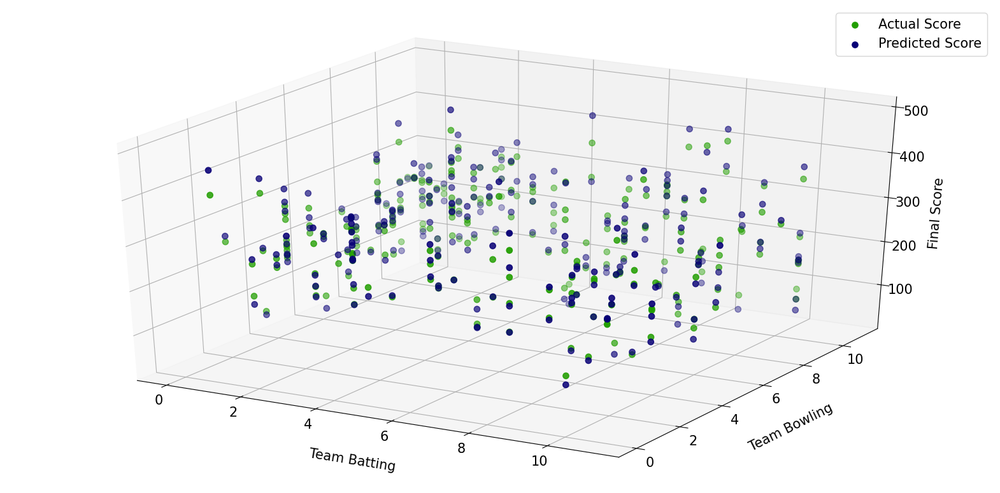

In [485]:
X,Y,Y_p = get_graph_data(x_40_50,y_40_50,Liner_R_model)
graph_real_and_predicted(X,Y,Y_p,"Linear_over_40_to_50")

<h6>Lasso Model

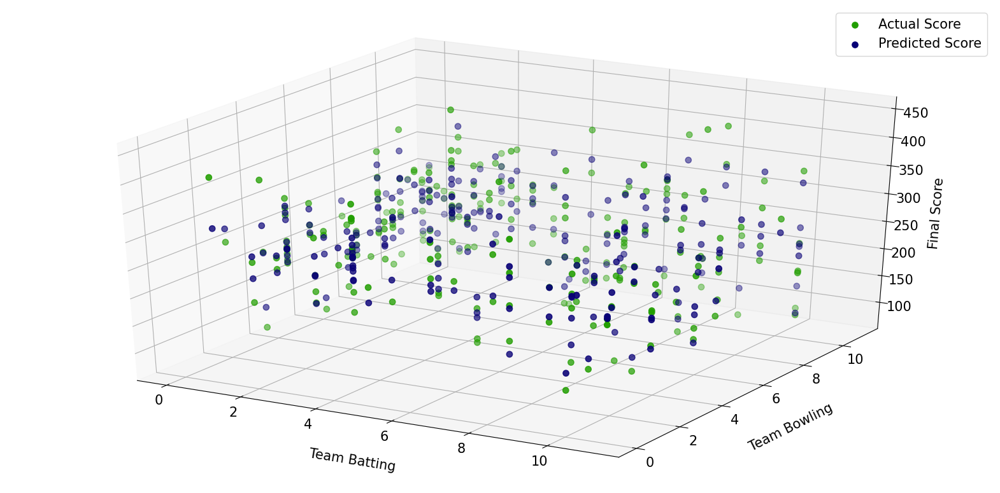

In [486]:
#All Data tested
X,Y,Y_p = get_graph_data(X_test_3,y_test_3,lasso_model)
graph_real_and_predicted(X,Y,Y_p,"Lasso_all_test_data")

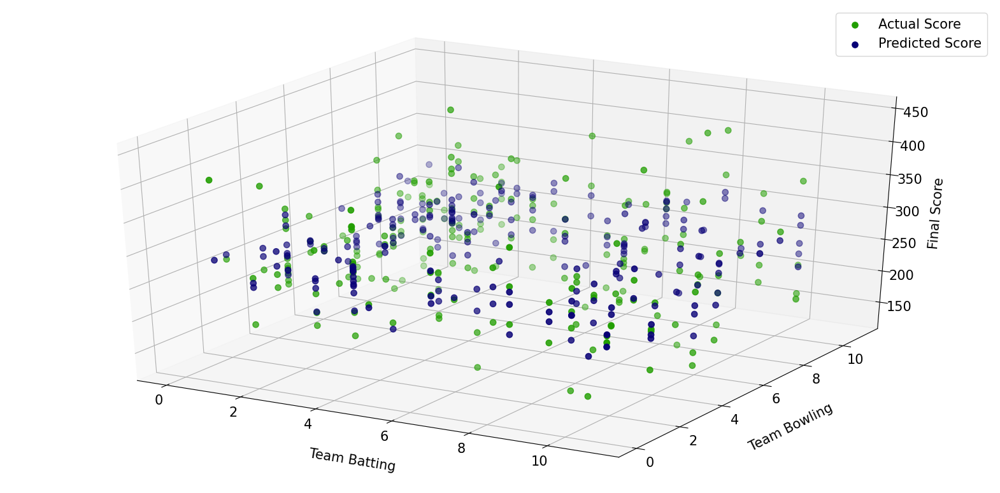

In [487]:
#over 0 to 20
X,Y,Y_p = get_graph_data(x_0_20,y_0_20,lasso_model)
graph_real_and_predicted(X,Y,Y_p,"Lasso_over_0_to_20")

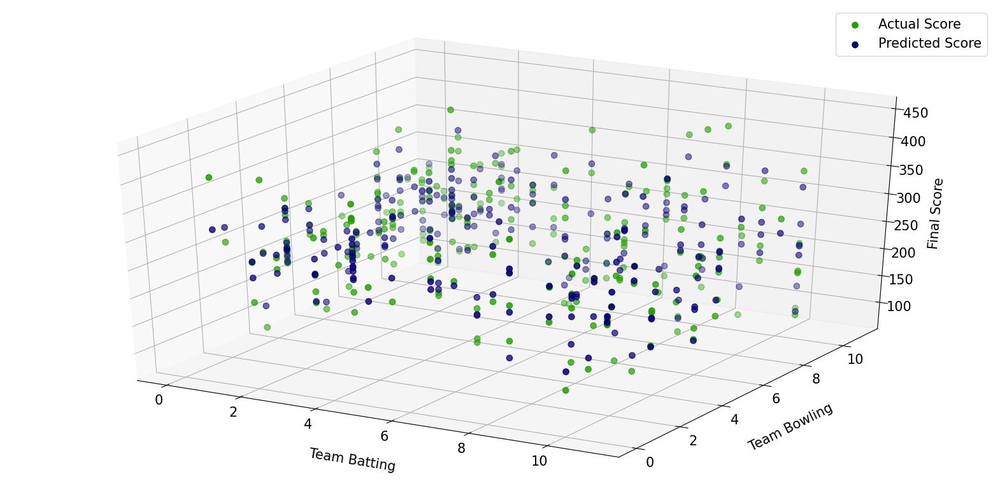

In [488]:
X,Y,Y_p = get_graph_data(x_20_30,y_20_30,lasso_model)
graph_real_and_predicted(X,Y,Y_p,"Lasso_over_20_to_30")

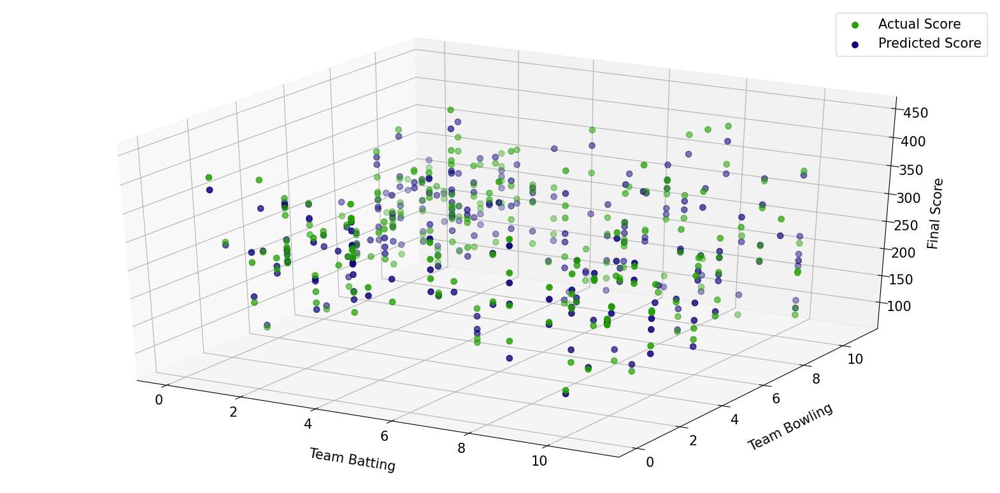

In [489]:
X,Y,Y_p = get_graph_data(x_30_40,y_30_40,lasso_model)
graph_real_and_predicted(X,Y,Y_p,"Lasso_over_30_to_40")

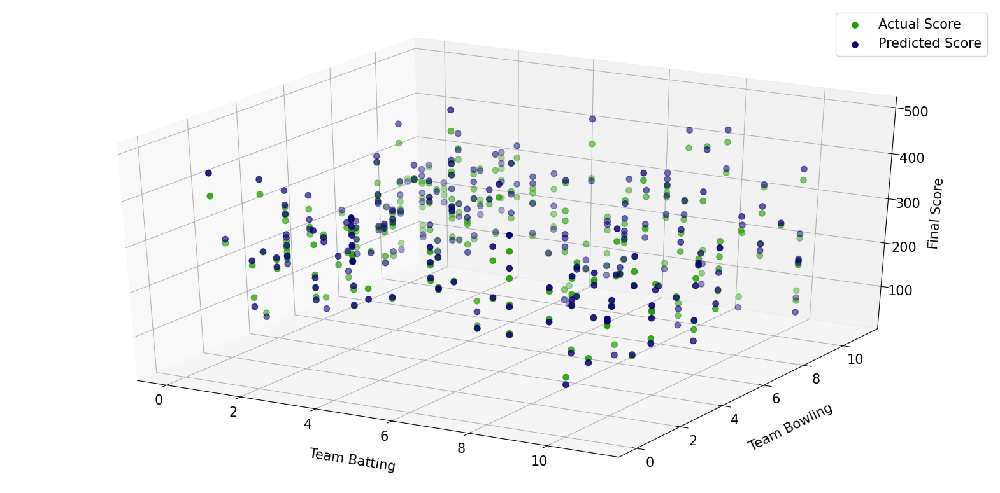

In [490]:
X,Y,Y_p = get_graph_data(x_40_50,y_40_50,lasso_model)
graph_real_and_predicted(X,Y,Y_p,"Lasso_over_40_to_50")

<h6>MLP Vs Linear Vs Lasso

In [647]:
def graph_real_and_predicted_all_model(X_graph, y_graph,ypred1,ypred2,ypred3,fname=None):
    X = X_graph
    Y = y_graph
    X1 = X['team_1']
    X2 = X['team_2']
    fig = plt.figure(dpi=100, figsize=(27, 13))
    plt.rc('font', size=25)          # controls default text sizes
    plt.rc('axes', titlesize=25)     # fontsize of the axes title
    plt.rc('axes', labelsize=25)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=20)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=20)    # fontsize of the tick labels
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(X1, X2, Y, c='#219E00', label='Actual Score', s = 100)
    ax.scatter(X1, X2, ypred1, c='#0115E9', label='Predicted Score by MLPRegressor', s = 100)
    ax.scatter(X1, X2, ypred2, c='#FF0303', label='Predicted Score by LinearRegression', s = 100)
    ax.scatter(X1, X2, ypred3, c='#FFFE09', label='Predicted Score by Lasso', s = 100)
    ax.set_xlabel('\n\n\nTeam Batting')
    ax.set_ylabel('\n\n\nTeam Bowling')
    ax.set_zlabel('\nFinal Score')
    plt.legend(loc = 2,fontsize = 20)
    if fname is not None:
        plt.savefig('images/' + fname + '.jpg')

In [648]:
def get_graph_data_all_models(X_test,y_test,model1,model2,model3):
    df = X_test.copy();
    df['final_score'] = y_test;
    df = df[df['remaining_ball']==(int(df['remaining_ball'].median()))]
    X, y = df.iloc[:,:-1],df.iloc[:,-1]
    y_pred1 = model1.predict(X)
    y_pred2 = model2.predict(X)
    y_pred3 = model3.predict(X)
    return X,y,y_pred1,y_pred2,y_pred3

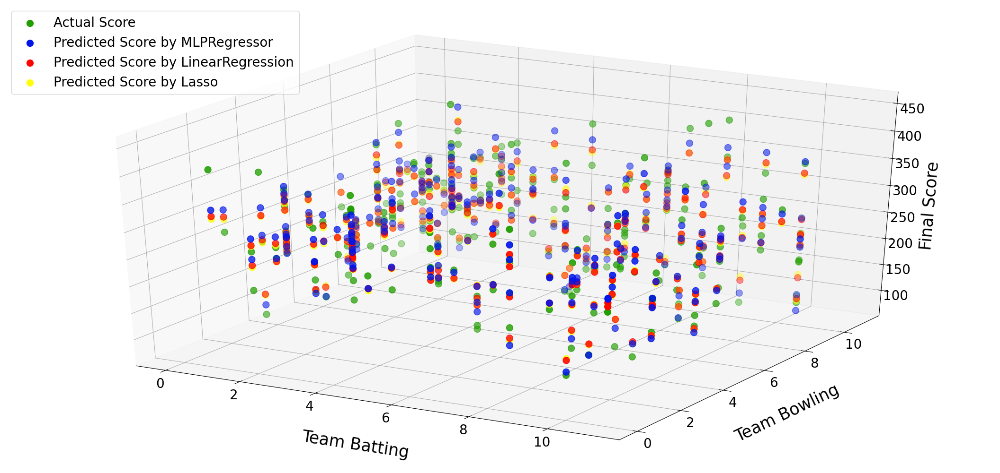

In [649]:
#All Data tested
X,Y,Y_p1,Y_p2,Y_p3 = get_graph_data_all_models(X_test_3,y_test_3,MLP_model,Liner_R_model,lasso_model)
graph_real_and_predicted_all_model(X,Y,Y_p1,Y_p2,Y_p3,"All_model_all_Test_Data")

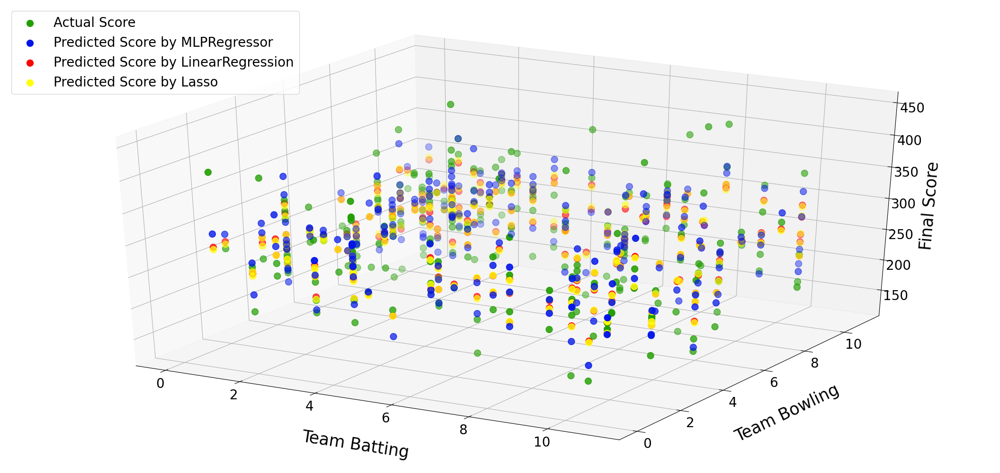

In [650]:
#over 0 to 20
X,Y,Y_p1,Y_p2,Y_p3 = get_graph_data_all_models(x_0_20,y_0_20,MLP_model,Liner_R_model,lasso_model)
graph_real_and_predicted_all_model(X,Y,Y_p1,Y_p2,Y_p3,"All_model_over_0_to_20")

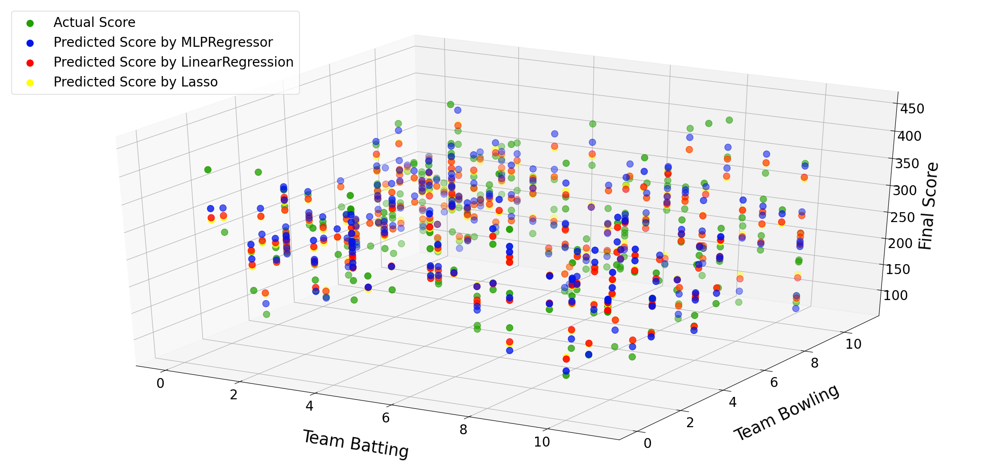

In [651]:
#over 20 to 30
X,Y,Y_p1,Y_p2,Y_p3 = get_graph_data_all_models(x_20_30,y_20_30,MLP_model,Liner_R_model,lasso_model)
graph_real_and_predicted_all_model(X,Y,Y_p1,Y_p2,Y_p3,"All_model_over_20_to_30")

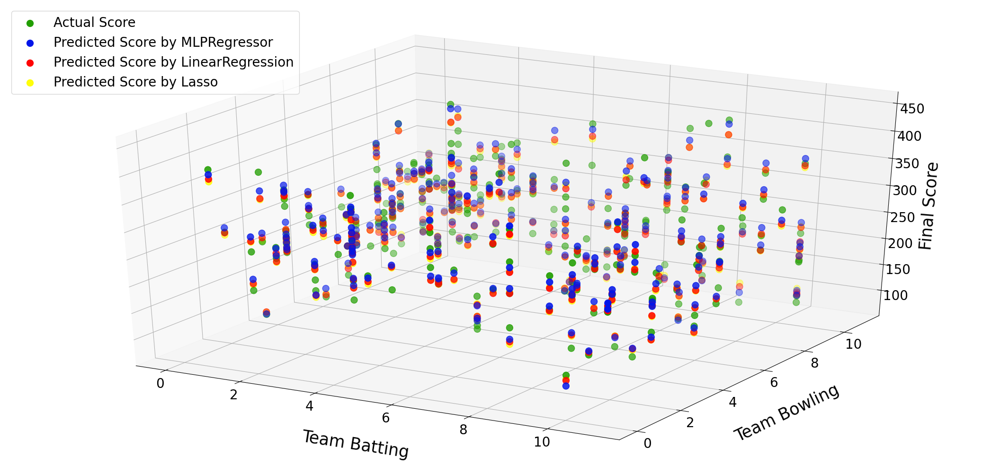

In [652]:
#over_30_to_40
X,Y,Y_p1,Y_p2,Y_p3 = get_graph_data_all_models(x_30_40,y_30_40,MLP_model,Liner_R_model,lasso_model)
graph_real_and_predicted_all_model(X,Y,Y_p1,Y_p2,Y_p3,"All_model_over_30_to_40")

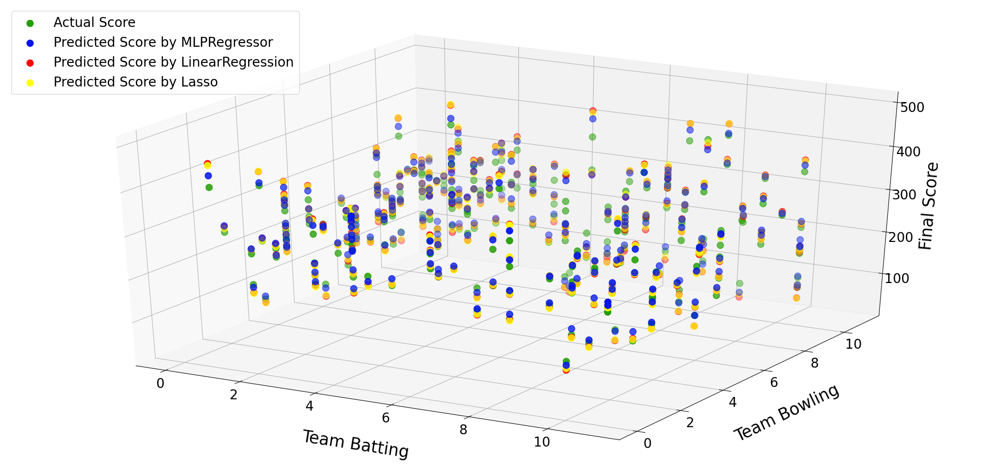

In [653]:
#over_40_to_50
X,Y,Y_p1,Y_p2,Y_p3 = get_graph_data_all_models(x_40_50,y_40_50,MLP_model,Liner_R_model,lasso_model)
graph_real_and_predicted_all_model(X,Y,Y_p1,Y_p2,Y_p3,"All_model_over_40_to_50")

<h1>Plotting Line Graph 

In [660]:
df_plot = pd.read_csv(r"ODI_ver4.csv")

In [661]:
odi_cases_test_train['set_3']['test_id'][254]#234 24

931390

In [662]:
def get_line_plot_data(df, regressor):
    X_test = decode_ODI(df)
    X_test = X_test[['city', 'neutralvenue', 'toss_winner', 'toss_decision',
           'team_1', 'team_2', 'batsman', 'non_striker', 'bowler', 'extras_run',
           'player_out', 'wickets', 'curr_score', 'remaining_ball']]
    y_pred = regressor.predict(X_test)
    df['model_prediction'] = y_pred
    df['final_score_actual_runrate'] = 0
    df['actual_run_rate_per_ball'] = 0
    for i in range(0,len(df)):
        df['actual_run_rate_per_ball'].iloc[i] = df['curr_score'].iloc[i]/(df['bno'].iloc[i]+1)
        df['final_score_actual_runrate'].iloc[i] = df['actual_run_rate_per_ball'].iloc[i]* df['Ball_Count'].iloc[i]

    df['over_no']=df['over'].astype(int)
    df['over_balls'] = round(df['over']-df['over_no'],1)
    df = df[df['over_balls']<0.7]
   
    overss = df['over_no'].unique()
    df_new = pd.DataFrame()
    for j in overss:
        temp = df[df['over_no']==j]
        temp['over_graph'] = 0
        for i in range(0,len(temp)):
            if(temp['over_balls'].iloc[i]==0.1):
                temp['over_graph'].iloc[i] = int(j)
            elif(temp['over_balls'].iloc[i]==0.2):
                temp['over_graph'].iloc[i]= int(j)+0.16667
            elif(temp['over_balls'].iloc[i]==0.3):
                temp['over_graph'].iloc[i]= int(j)+0.133334
            elif(temp['over_balls'].iloc[i]==0.4):
                temp['over_graph'].iloc[i]= int(j)+0.50001
            elif(temp['over_balls'].iloc[i]==0.5):
                temp['over_graph'].iloc[i]= int(j)+0.66668
            elif(temp['over_balls'].iloc[i]==0.6):
                temp['over_graph'].iloc[i]= int(j)+0.83335
        df_new=df_new.append(temp)
    df_new['final_score_actual_runrate']=df_new['final_score_actual_runrate'].astype(int)
    df_new['model_prediction']=df_new['model_prediction'].astype(int)
    return df_new[['over_graph','final_score_actual_runrate','final_score','model_prediction']]

In [663]:
df_plot = get_line_plot_data(df_plot[df_plot['match_id']==667729],MLP_model)

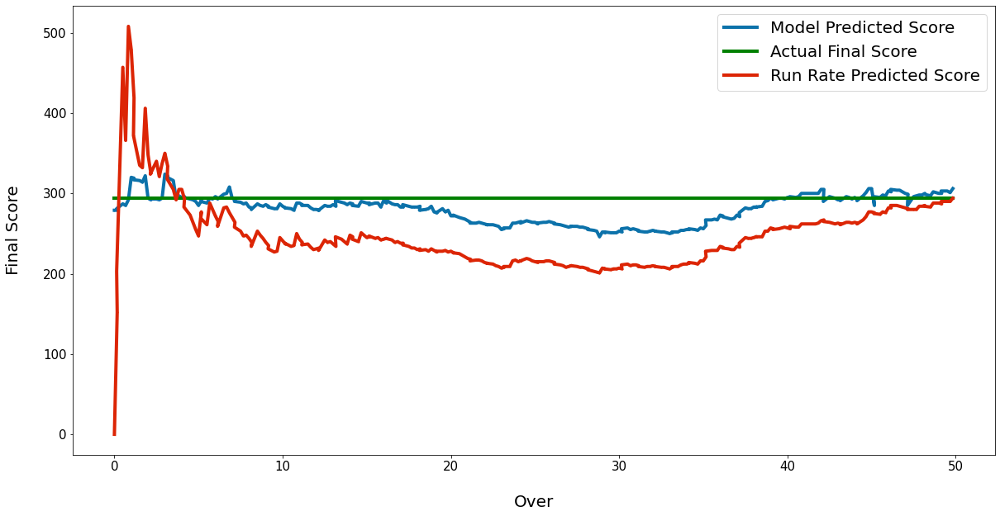

In [671]:
plt.rc('font', size=20)          # controls default text sizes
plt.rc('axes', titlesize=20)     # fontsize of the axes title
plt.rc('axes', labelsize=20)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=15)    # fontsize of the tick labels
plt.rc('ytick', labelsize=15)    # fontsize of the tick labels
plt.figure(figsize=(20,10))

# plotting the points 
plt.plot(df_plot['over_graph'], df_plot['model_prediction'], color='#0C72AA',linewidth = 4, 
         marker='o', markerfacecolor='red', markersize=1,label="Model Predicted Score")
plt.plot(df_plot['over_graph'], df_plot['final_score'], color='green',linewidth = 4, 
         marker='o', markerfacecolor='red', markersize=1,label="Actual Final Score")
plt.plot(df_plot['over_graph'], df_plot['final_score_actual_runrate'], color='#DC2505',linewidth = 4, 
         marker='o', markerfacecolor='red', markersize=1,label="Run Rate Predicted Score")

# setting x and y axis range 
#plt.ylim(yl,yu) 
#plt.xlim(low,up) 
# naming the x axis 
plt.xlabel('\nOver') 
# naming the y axis 
plt.ylabel('Final Score\n') 

# giving a title to my graph 
#plt.title('Accuracy For 5 Maximum Iterations\n') 
plt.legend()
# function to show the plot 
plt.savefig('images/' + "run_rate" + '.jpg')
plt.show() 

<h2>Loading Dataframe with Accuracy for different Layers

In [175]:
hd_result = pd.read_csv('accuracy_1_2000_layer.csv')
hd_result = hd_result[['Hidden_Layer','Accuracy']]

In [176]:
def plot_g(low,up,yl,yu):
    plt.rc('font', size=15)          # controls default text sizes
    plt.rc('axes', titlesize=15)     # fontsize of the axes title
    plt.rc('axes', labelsize=15)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=15)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=15)    # fontsize of the tick labels
    plt.figure(figsize=(22,8))

    # plotting the points 
    plt.plot(hd_result['Hidden_Layer'], hd_result['Accuracy'], color='green',linewidth = 3, 
             marker='o', markerfacecolor='red', markersize=1)

    # setting x and y axis range 
    plt.ylim(yl,yu) 
    plt.xlim(low,up) 
    # naming the x axis 
    plt.xlabel('\nNumber of Hidden Layers') 
    # naming the y axis 
    plt.ylabel('Accuracy (%)\n') 

    # giving a title to my graph 
    plt.title('Accuracy For 5 Maximum Iterations\n') 
    # function to show the plot 
    plt.show() 

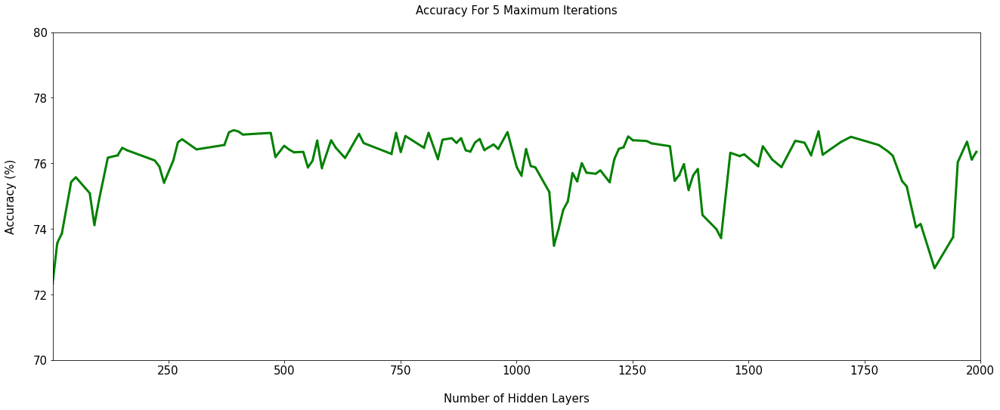

In [177]:
plot_g(1,2000,70,80)

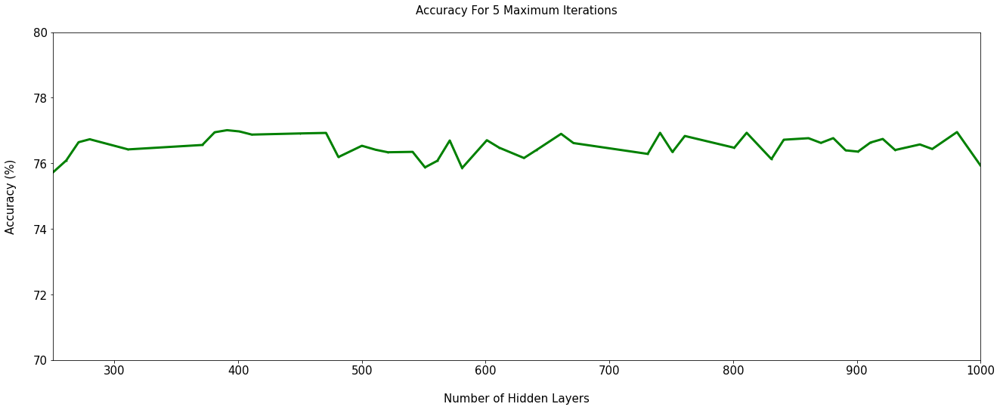

In [178]:
plot_g(250,1000,70,80)

In [181]:
hd_result[hd_result['Accuracy']==(hd_result['Accuracy'].max())]

,Hidden_Layer,Accuracy
21,391,77.013
